In [1]:
# Importação de bibliotecas
import os
import pandas as pd
import seaborn as sns
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import random

from branca import colormap as cmap
from folium import Circle, Choropleth, Marker
from folium.plugins import  MarkerCluster, TagFilterButton
from matplotlib import pyplot as plt

import warnings
warnings.filterwarnings("ignore")


### Visualização e estruturação do arquivo

In [2]:
# Especificação do caminho para a pasta "archive" relativo
pasta_archives = "archive"

# Nome do arquivo CSV que você deseja abrir
nome_arquivo_csv = "Brazil Total highway crashes 2010 - 2023.csv"

# Combine o caminho da pasta "archive" com o nome do arquivo CSV
caminho_completo = os.path.join(pasta_archives, nome_arquivo_csv)

# Verifique se o arquivo existe
if os.path.exists(caminho_completo):
    df = pd.read_csv(caminho_completo, low_memory=False)
else:
    print(f'O arquivo {caminho_completo} não existe.')

# Configurando modo de exibição de colunas e linhas
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows",None)
df.head()

,data,horario,n_da_ocorrencia,tipo_de_ocorrencia,km,trecho,sentido,lugar_acidente,tipo_de_acidente,automovel,bicicleta,caminhao,moto,onibus,outros,tracao_animal,transporte_de_cargas_especiais,trator_maquinas,utilitarios,ilesos,levemente_feridos,moderadamente_feridos,gravemente_feridos,mortos
0,01/01/2010,04:21:00,18,sem vítima,167,BR-393/RJ,Norte,Rodovia do Aço,Derrapagem,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0
1,01/01/2010,02:13:00,20,sem vítima,"269,5",BR-116/PR,Sul,Autopista Regis Bittencourt,Colisão Traseira,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
2,01/01/2010,03:35:00,000024/2010,sem vítima,77,BR-290/RS,Norte,Concepa,COLISÃO LATERAL,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,0.0,0.0,0.0,0.0
3,01/01/2010,07:31:00,000038/2010,sem vítima,52,BR-116/RS,Norte,Concepa,QUEDA DE MOTO,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0
4,01/01/2010,04:57:00,000027/2010,sem vítima,33,BR-290/RS,Norte,Concepa,QUEDA DE MOTO,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0


In [3]:
# Resumo estatístico do DataFrame
df.describe()

,bicicleta,onibus,outros,tracao_animal,trator_maquinas,levemente_feridos,moderadamente_feridos,gravemente_feridos,mortos
count,286533.000000,298905.000000,333473.000000,264040.000000,244183.000000,429776.000000,325635.000000,295579.000000,293688.000000
mean,0.034338,0.093103,0.236589,0.004927,0.003952,0.681429,0.262069,0.078504,0.066159
std,0.189994,0.308265,0.480300,0.070560,0.075154,1.004886,0.578391,0.326734,0.306649
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,5.000000,6.000000,9.000000,3.000000,6.000000,51.000000,34.000000,27.000000,31.000000


In [4]:
df.dtypes

data                               object
horario                            object
n_da_ocorrencia                    object
tipo_de_ocorrencia                 object
km                                 object
trecho                             object
sentido                            object
lugar_acidente                     object
tipo_de_acidente                   object
automovel                          object
bicicleta                         float64
caminhao                           object
moto                               object
onibus                            float64
outros                            float64
tracao_animal                     float64
transporte_de_cargas_especiais     object
trator_maquinas                   float64
utilitarios                        object
ilesos                             object
levemente_feridos                 float64
moderadamente_feridos             float64
gravemente_feridos                float64
mortos                            

#### Limpeza dos valores dos acidentes

In [5]:
vl = df["tipo_de_ocorrencia"].value_counts()
print(f"Tipo de ocorrência: \n\n\n", vl)

Tipo de ocorrência: 


 sem vítima                                                   411519
com vítima                                                   197166
Sem vítima                                                    58680
Acidente sem Vítima                                           23886
3 - Acidente com Danos Materiais                              22884
Acidente sem vítima                                           20769
Acidente com vítima                                           18687
Com vítima                                                    18245
ac02 - Acidente com Vítima                                    15290
2 - Acidente com VITIMA                                       10098
Acidente com Vítima                                            9340
AC03 - Acidente sem VITIMA                                     8451
Acidente sem Vítimas                                           5511
AC02 - Acidente com VITIMA                                     4968
ac03 - Acidente com Dano

In [6]:
limpeza_ocorrencia = {
    "sem vítima":"sem vítima",
    "com vítima":"com vítima",
    "Sem vítima":"sem vítima",
    "Acidente sem Vítima":"sem vítima",
    "Acidente com Danos Materiais":"com danos materiais",
    "Acidente sem vítima":"sem vítima",
    "Acidente com vítima":"com vítima",
    "Com vítima":"com vítima",
    "ac02 - Acidente com Vítima":"com vítima",
    "2 - Acidente com VITIMA":"com vítima",
    "Acidente com Vítima":"com vítima",
    "AC03 - Acidente sem VITIMA":"sem vítima",
    "Acidente sem Vítimas":"sem vítima",
    "AC02 - Acidente com VITIMA":"com vítima",
    "ac03 - Acidente com Danos Materiais":"com danos materiais",
    "AC03 - ACIDENTE SEM VÍTIMA":"sem vítima",
    "Acidente sem VITIMA":"sem vítima",
    "Acidente com Vítimas":"com vítima",
    "Acidente com Danos Materiais":"com danos materiais",
    "ASV - Acidente SEM Vítima":"sem vítima",
    "AC02 - ACIDENTE COM VÍTIMA":"com vítima",
    "ac03 - Acidente com vítima ilesa":"com vítima ilesa",
    "Acidente com VITIMA":"com vítima",
    "ac02 - Acidente com vítima":"com vítima",
    "Atropelamento sem Morte":"atropelamento sem vítima fatal",
    "ac01 - Acidente com Vítima Fatal":"com vítima fatal",
    "AV - Acidente com VITIMA":"com vítima",
    "3 - Acidente com Vitima Sem Lesão":"com vítima ilesa",
    "Atropelamento sem morte":"atropelamento sem vítima fatal",
    "Acidente com Morte":"com vítima fatal",
    "Acidente com morte":"com vítima fatal",
    "1 - Acidente com Vitima Fatal":"com vítima fatal",
    "2 - Acidente com Vitima":"com vítima",
    "Atropelamento com morte":"atropelamento com vítima fatal",
    "AC02-ACIDENTE COM VÍTIMA":"com vítima",
    "Acidente Fatal":"com vítima fatal",
    "Atropelamento com Morte":"atropelamento com vítima fatal",
    "AC03-ACIDENTE SEM VÍTIMA":"sem vítima",
    "AC04 - Atropelamento":"atropelamento",
    "AC01 - ACIDENTE COM VÍTIMA FATAL":"com vítima fatal",
    "AF - Acidente com Vitima Fatal":"com vítima fatal",
    "AC01 - Acidente com VITIMA FATAL":"com vítima fatal",
    "ac01 - Acidente com vitima fatal":"com vítima fatal",
    "Acidente com VITIMA FATAL":"com vítima fatal",
    "AC05 - Atropelamento Fatal":"atropelamento com vítima fatal",
    "Atropelamento":"atropelamento",
    "Acidente sem Vítima - TRECHO CONTORNO":"sem vítima",
    "Acidente COM VITIMA":"com vítima",
    "AC3 - Acidente sem VITIMA":"sem vítima",
    "AC2 - Acidente com VITIMA":"com vítima",
    "Atropelamento Fatal":"atropelamento com vítima fatal",
    "ac03 - Acidente sem Vitimas":"sem vítima",
    "Acidente com Vítima - TRECHO CONTORNO":"com vítima",
    "Acidente sem vítima - TRECHO CONTORNO":"sem vítima",
    "AC01-ACIDENTE COM VÍTIMA FATAL":"com vítima fatal",
    "ac02 - Acidente com VITIMA":"com vítima",
    " 2- Acidente com VITIMA":"com vítima",
    "Acidente com vítima - TRECHO CONTORNO":"com vítima",
    "Acidente com Vítima Fatal":"com vítima fatal",
    "A PP - Acidente envolvendo Produto Perigoso":"com produto perigoso",
    "Acidente fatal":"com vítima fatal",
    "in21 - Suícidio":"suicídio",
    "AC1 - Acidente com VITIMA FATAL":"com vítima fatal",
    "A PPV - Acidente envolvendo Produto Perigoso com vitima":"com produto perigoso e com vítima",
    "A PPF - Acidente envolvendo Produto Perigoso vitima fatal":"com produto perigoso e com vítima fatal",
    "Acidente com Morte - TRECHO CONTORNO":"com vítima fatal",
    "Acidente com morte - TRECHO CONTORNO":"com vítima fatal",
    "Atropelamento sem morte - TRECHO CONTORNO":"atropelamento sem vítima fatal",
    "Atropelamento sem Morte - TRECHO CONTORNO":"atropelamento sem vítima fatal",
    "3 - Acidente com Danos Materiais":"com danos materiais",
    "ac01 - Acidente com Vitima Fatal":"com vítima fatal"
}

In [7]:
df["tipo_de_ocorrencia"] = df["tipo_de_ocorrencia"].replace(limpeza_ocorrencia)

In [8]:
vl = df["tipo_de_ocorrencia"].value_counts()
print(f"Tipo de ocorrência: \n\n\n", vl)

Tipo de ocorrência: 


 sem vítima                                 539497
com vítima                                 284178
com danos materiais                         31192
com vítima fatal                             3845
com vítima ilesa                             2799
atropelamento sem vítima fatal               2164
atropelamento com vítima fatal                600
atropelamento                                 263
com produto perigoso                           11
suicídio                                        4
com produto perigoso e com vítima               3
com produto perigoso e com vítima fatal         2
Name: tipo_de_ocorrencia, dtype: int64


#### Limpeza dos valores do sentido

In [9]:
vl = df["sentido"].value_counts()
print(f"Sentido: \n\n\n", vl)

Sentido: 


 Norte                      305564
Sul                        302783
Pista Norte                 64831
Pista Sul                   61131
Decrescente                 38170
Crescente                   38015
Leste                       20829
Oeste                       19345
RJ                           5319
JF                           4201
NORTE                        1053
SUL                           788
N                             277
S                             210
Ambos                         189
 Norte                         50
Sul - TRECHO CONTORNO          43
 Sul                           39
Norte - TRECHO CONTORNO        26
Name: sentido, dtype: int64


In [10]:
limpeza_sentido = {
    "Norte":"norte",
    "Sul":"sul",
    "Pista Norte":"norte",
    "Pista Sul":"sul",
    "Decrescente":"decrescente",
    "Crescente":"crescente",
    "Leste":"leste",
    "Oeste":"oeste",
    "RJ":"outros",
    "JF":"outros",
    "NORTE":"norte",
    "SUL":"sul",
    "N":"norte",
    "S":"sul",
    "Ambos":"outros",
    "Norte":"norte",
    "Sul - TRECHO CONTORNO":"sul",
    "Sul":"sul",
    "Norte - TRECHO CONTORNO":"norte",
    " Norte":"norte",
    " Sul":"sul"
}

In [11]:
df["sentido"] = df["sentido"].replace(limpeza_sentido)

In [12]:
df["sentido"].value_counts()

norte          371801
sul            364994
decrescente     38170
crescente       38015
leste           20829
oeste           19345
outros           9709
Name: sentido, dtype: int64

### Quais trechos das rodovias brasileiras privadas são os mais perigosos?

In [13]:
df["lugar_acidente"].value_counts()

Autopista Litoral Sul          123319
Novadutra                      114994
Autopista Fernão Dias          108496
Autopista Regis Bittencourt     73109
Concer                          48022
Concebra                        46810
Autopista Fluminense            46252
Via Bahia                       42856
ECO101                          38029
VIA040                          37723
Cro                             31015
Autopista Planalto Sul          23516
MSVIA                           19109
Crt                             16462
Concepa                         13622
ECO050                          13015
Transbrasiliana                 12520
Rodovia do Aço                  11541
Via Costeira                     9325
RIOSP                            9163
Ecosul                           8059
Via Sul                          6608
Ecoponte                         3918
Ecoriominas                      2701
Ecovias do Araguaia              2014
Ecovias do Cerrado               1879
Via Brasil  

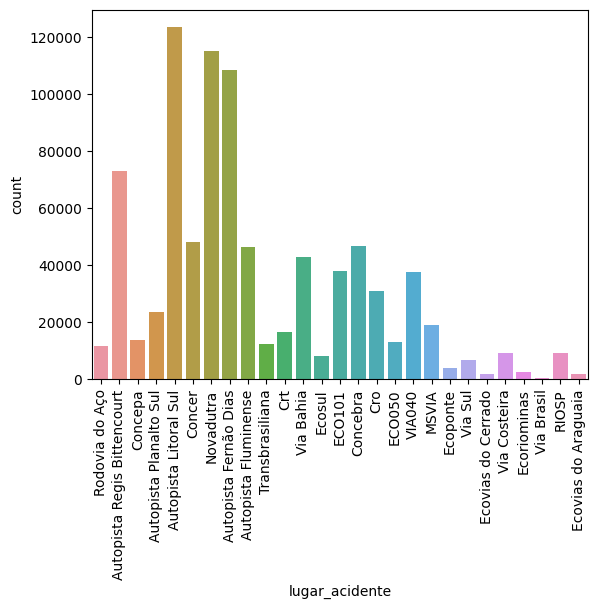

In [14]:
sns.countplot(data=df, x=df['lugar_acidente'])
plt.xticks(rotation=90)
plt.show()

In [15]:
grupo_lugar_acidente = df.groupby('lugar_acidente').sum()

grupo_lugar_acidente[:5]

,bicicleta,onibus,outros,tracao_animal,trator_maquinas,levemente_feridos,moderadamente_feridos,gravemente_feridos,mortos
lugar_acidente,,,,,,,,,
Autopista Fernão Dias,418.0,2102.0,8473.0,13.0,22.0,35758.0,6076.0,1904.0,1903.0
Autopista Fluminense,853.0,2498.0,4983.0,9.0,14.0,17873.0,7088.0,1781.0,1498.0
Autopista Litoral Sul,1646.0,1530.0,13590.0,28.0,31.0,30755.0,6402.0,2027.0,1676.0
Autopista Planalto Sul,208.0,483.0,1644.0,1.0,51.0,7921.0,773.0,1208.0,746.0
Autopista Regis Bittencourt,424.0,4750.0,5105.0,1016.0,20.0,20423.0,4343.0,1110.0,1364.0


In [16]:
df_lugar_ferimento = grupo_lugar_acidente[['levemente_feridos', 'moderadamente_feridos', 'gravemente_feridos']]

df_lugar_ferimento.reset_index(inplace=True)

df_lugar_ferimento.columns = ['lugar de acidente', 'grau de ferimento leve', 'grau de ferimento moderado', 'grau de ferimento grave']

df_lugar_ferimento[:5]

,lugar de acidente,grau de ferimento leve,grau de ferimento moderado,grau de ferimento grave
0,Autopista Fernão Dias,35758.0,6076.0,1904.0
1,Autopista Fluminense,17873.0,7088.0,1781.0
2,Autopista Litoral Sul,30755.0,6402.0,2027.0
3,Autopista Planalto Sul,7921.0,773.0,1208.0
4,Autopista Regis Bittencourt,20423.0,4343.0,1110.0


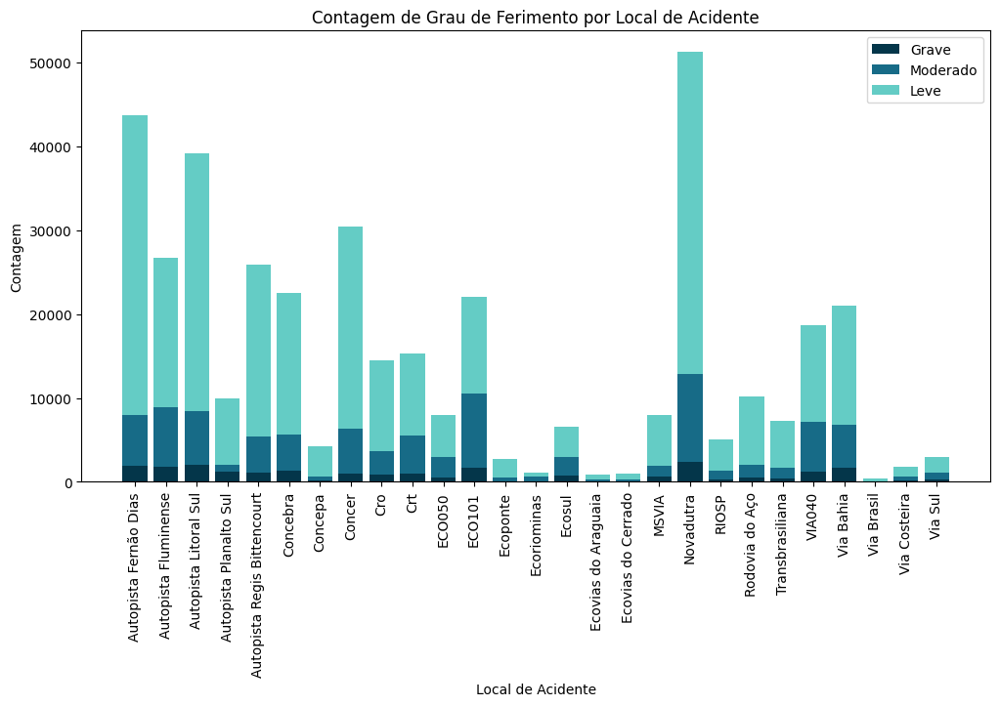

In [17]:
# Supondo que df_lugar_mortalidade seja seu DataFrame
plt.figure(figsize=(12, 6))

# Calcular a contagem de mortos, vítimas e ilesos por local de acidente
contagem_por_local = df_lugar_ferimento.groupby('lugar de acidente')[['grau de ferimento leve', 'grau de ferimento moderado', 'grau de ferimento grave']].sum().reset_index()

# Criar o gráfico de barras empilhado
plt.bar(contagem_por_local['lugar de acidente'], contagem_por_local['grau de ferimento grave'], label='Grave', color='#04364A')
plt.bar(contagem_por_local['lugar de acidente'], contagem_por_local['grau de ferimento moderado'], label='Moderado', color='#176B87', bottom=contagem_por_local['grau de ferimento grave'])
plt.bar(contagem_por_local['lugar de acidente'], contagem_por_local['grau de ferimento leve'], label='Leve', color='#64CCC5', bottom=contagem_por_local['grau de ferimento grave'] + contagem_por_local['grau de ferimento moderado'])

plt.xticks(rotation=90)
plt.xlabel('Local de Acidente')
plt.ylabel('Contagem')
plt.title('Contagem de Grau de Ferimento por Local de Acidente')
plt.legend()
plt.show()

In [18]:
df_lugar_mortalidade = grupo_lugar_acidente[['mortos']]

df_lugar_mortalidade.reset_index(inplace=True)

df_lugar_mortalidade.columns = ['lugar de acidente', 'mortos']

df_lugar_mortalidade[:5]

,lugar de acidente,mortos
0,Autopista Fernão Dias,1903.0
1,Autopista Fluminense,1498.0
2,Autopista Litoral Sul,1676.0
3,Autopista Planalto Sul,746.0
4,Autopista Regis Bittencourt,1364.0


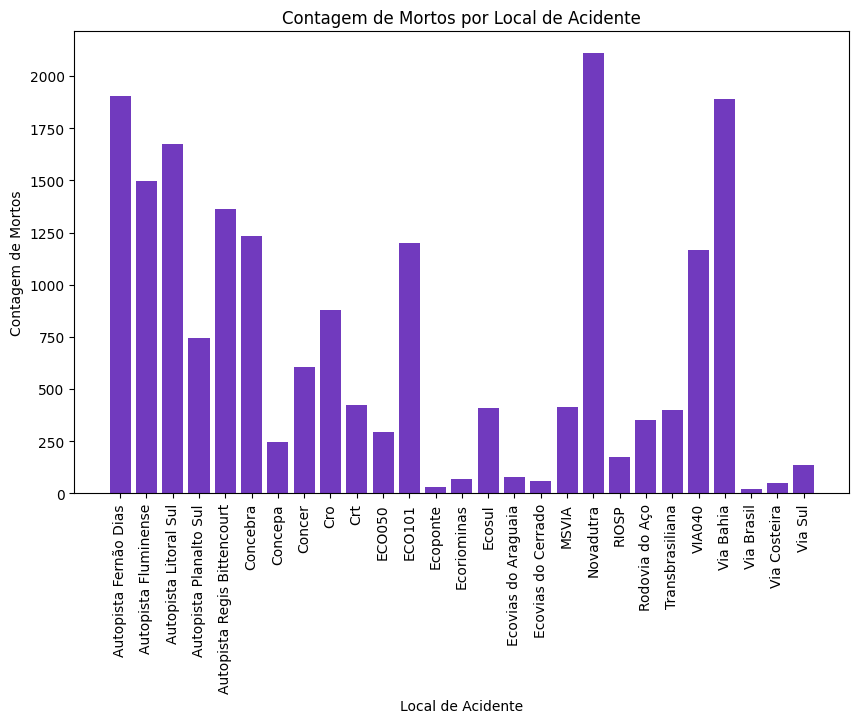

In [19]:
plt.figure(figsize=(10, 6))

# Calcular a contagem de mortos por local de acidente
contagem_mortos = df_lugar_mortalidade.groupby('lugar de acidente')['mortos'].sum().reset_index()

# Criar o gráfico de barras
plt.bar(contagem_mortos['lugar de acidente'], contagem_mortos['mortos'], color='#713ABE')

plt.xticks(rotation=90)
plt.xlabel('Local de Acidente')
plt.ylabel('Contagem de Mortos')
plt.title('Contagem de Mortos por Local de Acidente')
plt.show()

In [20]:
# Filtrar apenas as linhas com "com vítimas" e "sem vítimas"
df_filtrado_ocorrencia = df[df['tipo_de_ocorrencia'].isin(['com vítima', 'sem vítima'])]

# Realize a contagem das ocorrências de "com vítimas" e "sem vítimas" para cada rua
df_lugar_ocorrencia = df_filtrado_ocorrencia.groupby(['lugar_acidente', 'tipo_de_ocorrencia']).size().unstack(fill_value=0)

df_lugar_ocorrencia.columns = ['com vitimas', 'sem vitimas']

df_lugar_ocorrencia_vitimas = df_lugar_ocorrencia

df_lugar_ocorrencia_vitimas.reset_index(inplace=True)

df_lugar_ocorrencia_vitimas.columns = ['Lugar de Acidente', 'Com Vítimas', 'Sem Vítimas']

df_lugar_ocorrencia_vitimas[:5]

,Lugar de Acidente,Com Vítimas,Sem Vítimas
0,Autopista Fernão Dias,30760,71025
1,Autopista Fluminense,18194,26038
2,Autopista Litoral Sul,32692,82707
3,Autopista Planalto Sul,7418,15067
4,Autopista Regis Bittencourt,19720,47717


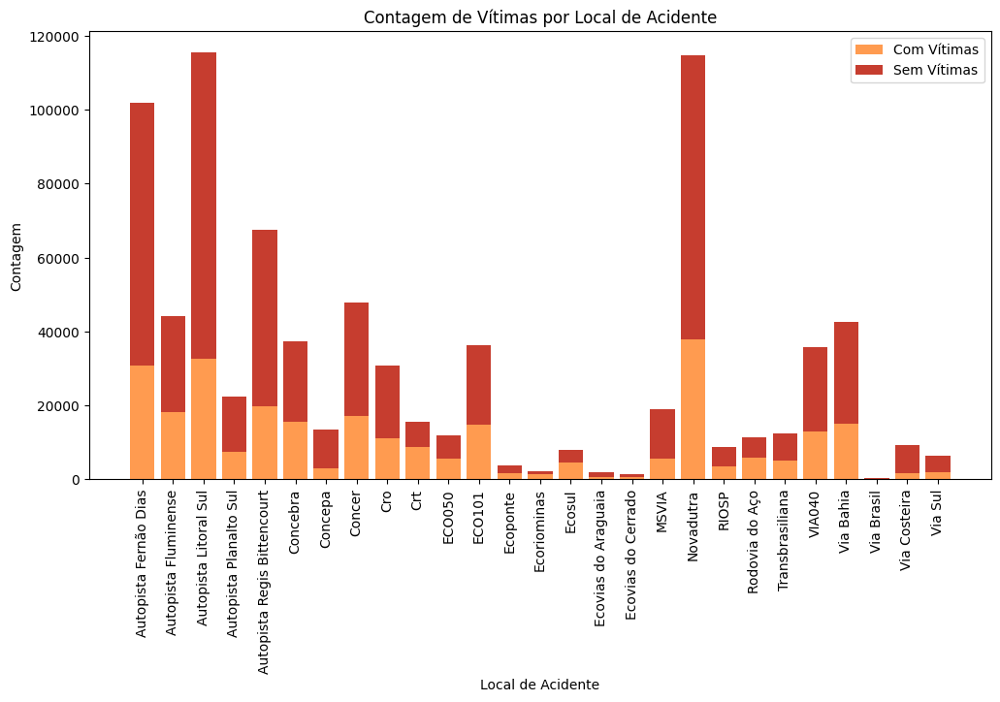

In [21]:
# Supondo que df_lugar_mortalidade seja seu DataFrame
plt.figure(figsize=(12, 6))

# Calcular a contagem de mortos, vítimas e ilesos por local de acidente
contagem_por_local = df_lugar_ocorrencia_vitimas.groupby('Lugar de Acidente')[['Com Vítimas', 'Sem Vítimas']].sum().reset_index()

# Criar o gráfico de barras empilhado
plt.bar(contagem_por_local['Lugar de Acidente'], contagem_por_local['Com Vítimas'], label='Com Vítimas', color='#FF9B50')
plt.bar(contagem_por_local['Lugar de Acidente'], contagem_por_local['Sem Vítimas'], label='Sem Vítimas', color='#C63D2F', bottom=contagem_por_local['Com Vítimas'])

plt.xticks(rotation=90)
plt.xlabel('Local de Acidente')
plt.ylabel('Contagem')
plt.title('Contagem de Vítimas por Local de Acidente')
plt.legend()
plt.show()

### Quais são os estados brasileiros com maior incidência de acidentes?

In [22]:
# Extrair os estados da coluna 'trecho' usando uma expressão regular
df['estado'] = df['trecho'].str.extract(r'\/([A-Z]{2})')

df_estados_contagem = df['estado'].value_counts()

df_estados_acidentes = pd.DataFrame(df_estados_contagem).reset_index()
df_estados_acidentes.columns = ['Estado', 'Total de Acidentes']

df_estados_acidentes = df_estados_acidentes.sort_values(by='Total de Acidentes', ascending=False)

df_estados_acidentes[:5]

,Estado,Total de Acidentes
0,RJ,176428
1,MG,150434
2,SP,120187
3,SC,108155
4,PR,100973


In [23]:
brasil_gdf_arquivo = "archive/brazil_geo.json"

brasil_gdf = gpd.read_file(brasil_gdf_arquivo)

display(brasil_gdf.head())

,id,name,geometry
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350..."
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.86181, -35.90153 ..."
2,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0..."
3,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.61900..."
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708..."


In [24]:
df_regioes_estados_acidentes = brasil_gdf.merge(df_estados_acidentes, left_on='id', right_on='Estado')

df_regioes_estados_acidentes[:5]

,id,name,geometry,Estado,Total de Acidentes
0,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",BA,42867
1,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.77200 -15.5...",DF,3728
2,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403...",ES,37737
3,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4...",GO,36420
4,MT,Mato Grosso,"POLYGON ((-57.60524 -8.66285, -57.59355 -8.707...",MT,31196


In [25]:
coordenadas = [-15.77972, -47.92972]
zstart = 4

colors = ['LightBlue', 'LightGreen', 'Green', 'Orange', 'DarkOrange', 'DarkRed']
style_function = lambda x: {'weight': 0.8, 
                            'color': 'black',
                            'fillColor': colormap(x['properties']['Total de Acidentes']), 
                            'fillOpacity': 0.75}

colormap = cmap.LinearColormap(colors = colors, 
                            vmin = df_regioes_estados_acidentes['Total de Acidentes'].min(), 
                            vmax = df_regioes_estados_acidentes['Total de Acidentes'].max(), 
                            caption = f"Total de Acidentes")

map_estados_acidentes = folium.Map(location = coordenadas, tiles = 'cartodbpositron', zoom_start = zstart)

colormap.add_to(map_estados_acidentes)

folium.features.GeoJson(
    df_regioes_estados_acidentes,
    style_function = style_function
).add_to(map_estados_acidentes)

map_estados_acidentes

### Qual é a relação do período de tempo com o grau de ferimento?

In [26]:
attrs = ['km', 'trecho', 'sentido', 'lugar_acidente','ilesos','levemente_feridos', 'moderadamente_feridos', 'gravemente_feridos', 'mortos', 'data']
df_horario_ferimentos = df[attrs]

df_horario_ferimentos = df_horario_ferimentos.fillna(0)

df_horario_ferimentos['ilesos'].fillna(0, inplace=True)

for coluna in attrs:
    if df_horario_ferimentos[coluna].dtype == 'object':
        continue
    df_horario_ferimentos[coluna] = pd.to_numeric(df_horario_ferimentos[coluna], errors='coerce')

df_horario_ferimentos['ano'] = df_horario_ferimentos['data'].str[6:]
conversao_ano = df_horario_ferimentos['ano'].astype(int)
df_horario_ferimentos['ano'] = conversao_ano

df_horario_ferimentos['ilesos'] = pd.to_numeric(df_horario_ferimentos['ilesos'], errors='coerce')

contagem_por_ano = df_horario_ferimentos.groupby('ano')[['ilesos', 'levemente_feridos', 'moderadamente_feridos', 'gravemente_feridos', 'mortos']].sum()

contagem_por_ano = contagem_por_ano.rename(columns={'ilesos':'Ilesos', 'levemente_feridos':'Levemente Feridos', 'moderadamente_feridos':'Moderadamente Feridos', 'gravemente_feridos':'Gravemente Feridos', 'mortos':'Mortos', 'ano':'Anos'})

In [27]:
contagem_por_ano = contagem_por_ano.reset_index()

contagem_por_ano[:5]

,ano,Ilesos,Levemente Feridos,Moderadamente Feridos,Gravemente Feridos,Mortos
0,2010,123302.0,18774.0,5508.0,1582.0,1472.0
1,2011,133759.0,20021.0,6262.0,1745.0,1514.0
2,2012,140085.0,21424.0,5908.0,1781.0,1468.0
3,2013,136936.0,20837.0,5458.0,1572.0,1502.0
4,2014,147719.0,24229.0,6486.0,1967.0,1684.0


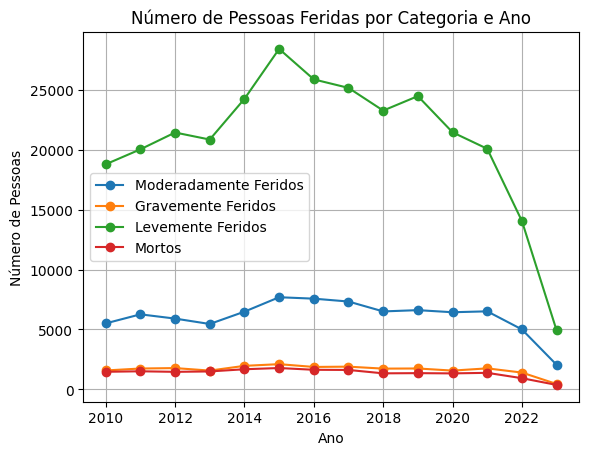

In [28]:
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Moderadamente Feridos'], label='Moderadamente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Gravemente Feridos'], label='Gravemente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Levemente Feridos'], label='Levemente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Mortos'], label='Mortos', marker='o', linestyle='-')

plt.xlabel('Ano')
plt.ylabel('Número de Pessoas')
plt.title('Número de Pessoas Feridas por Categoria e Ano')

plt.legend()

plt.grid(True)
plt.show()

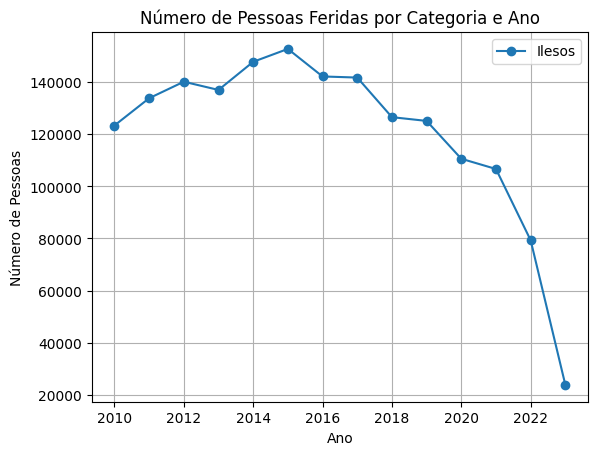

In [29]:
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Ilesos'], label='Ilesos', marker='o', linestyle='-')

plt.xlabel('Ano')
plt.ylabel('Número de Pessoas')
plt.title('Número de Pessoas Feridas por Categoria e Ano')

plt.legend()

plt.grid(True)
plt.show()

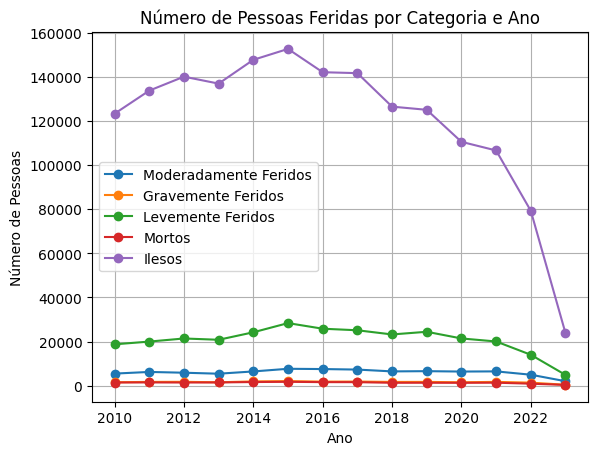

In [30]:
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Moderadamente Feridos'], label='Moderadamente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Gravemente Feridos'], label='Gravemente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Levemente Feridos'], label='Levemente Feridos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Mortos'], label='Mortos', marker='o', linestyle='-')
plt.plot(contagem_por_ano['ano'], contagem_por_ano['Ilesos'], label='Ilesos', marker='o', linestyle='-')

plt.xlabel('Ano')
plt.ylabel('Número de Pessoas')
plt.title('Número de Pessoas Feridas por Categoria e Ano')

plt.legend()

plt.grid(True)
plt.show()

### Quais são os horários mais propícios para ocorrência de acidentes?

In [31]:
attrs = ['horario', 'bicicleta', 'caminhao', 'moto', 'onibus', 'outros', 'tracao_animal', 'transporte_de_cargas_especiais', 'trator_maquinas', 'utilitarios']
df_horario_acidentes = df[attrs]

df_horario_acidentes = df_horario_acidentes.fillna(0)

for coluna in attrs:
    if coluna != "horario":
        df_horario_acidentes[coluna] = pd.to_numeric(df_horario_acidentes[coluna], errors='coerce')

df_horario_acidentes['horario'] = pd.to_datetime(df_horario_acidentes['horario'])

df_horario_acidentes['hora'] = df_horario_acidentes['horario'].dt.strftime('%H')

df_horario_acidentes['total_acidentes'] = df_horario_acidentes[['bicicleta', 'caminhao', 'moto', 'onibus', 'outros', 'tracao_animal', 'transporte_de_cargas_especiais', 'trator_maquinas', 'utilitarios']].sum(axis=1)

contagem_por_horario = df_horario_acidentes.groupby('hora')[['total_acidentes']].sum()

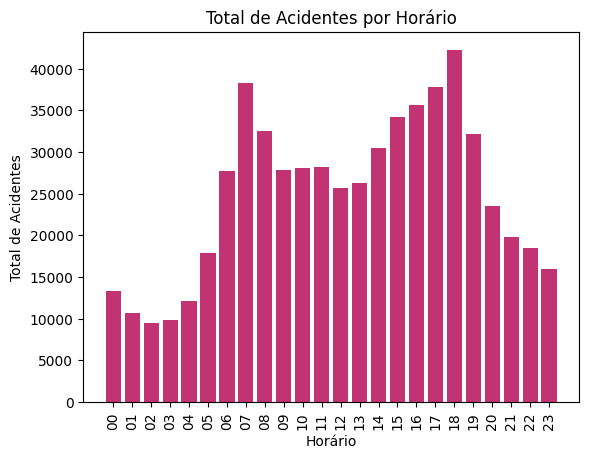

In [32]:
plt.bar(contagem_por_horario.index, contagem_por_horario['total_acidentes'], color='#C23373')
plt.xlabel('Horário')
plt.ylabel('Total de Acidentes')
plt.title('Total de Acidentes por Horário')
plt.xticks(rotation=90)

plt.show()

### Quais tipos de automóveis estão mais envolvidos em acidentes?

In [33]:
attrs = ['bicicleta', 'caminhao', 'moto', 'onibus', 'outros', 'tracao_animal', 'transporte_de_cargas_especiais', 'trator_maquinas', 'utilitarios']
df_automoveis_acidentes = df[attrs]

df_automoveis_acidentes = df_automoveis_acidentes.fillna(0)

for coluna in attrs:
    df_automoveis_acidentes[coluna] = pd.to_numeric(df_automoveis_acidentes[coluna], errors='coerce')

contagem_automoveis_acidentes = df_automoveis_acidentes.sum(numeric_only=True)

df_automoveis_acidentes_total = pd.DataFrame({
    'Veículo': attrs,
    'Total de Acidentes': contagem_automoveis_acidentes
})

df_automoveis_acidentes_total = df_automoveis_acidentes_total.sort_values(by='Total de Acidentes', ascending=False)

In [34]:
limpeza_veiculos = {
    'caminhao': 'Caminhão',
    'moto':'Moto',
    'outros':'Outros',
    'utilitarios':'Utilitários',
    'onibus':'Ônibus',
    'bicicleta':'Bicicleta',
    'transporte_de_cargas_especiais':'Transporte de Cargas Especiais',
    'tracao_animal':'Tração Animal',
    'trator_maquinas':'Trator Máquinas'
}

df_automoveis_acidentes_total['Veículo'] = df_automoveis_acidentes_total['Veículo'].replace(limpeza_veiculos)

print(df_automoveis_acidentes_total.to_string(index=False))

                       Veículo  Total de Acidentes
                      Caminhão            271106.0
                          Moto            141910.0
                        Outros             78896.0
                   Utilitários             61750.0
                        Ônibus             27829.0
                     Bicicleta              9839.0
Transporte de Cargas Especiais              4844.0
                 Tração Animal              1301.0
               Trator Máquinas               965.0


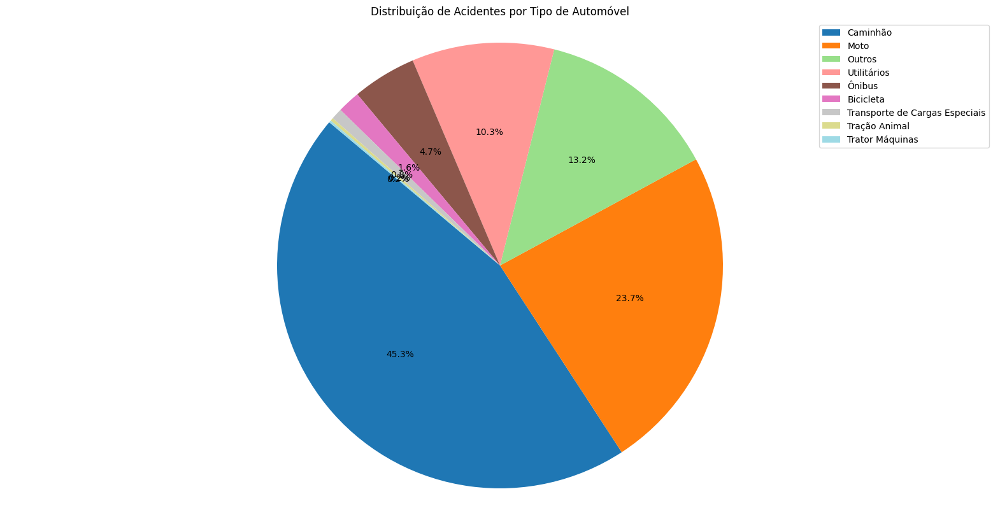

In [35]:
num_veiculos = len(df_automoveis_acidentes_total)
unique_colors = plt.cm.get_cmap('tab20', num_veiculos)
colors = [unique_colors(i) for i in range(num_veiculos)]

plt.figure(figsize=(20, 10))
plt.pie(df_automoveis_acidentes_total['Total de Acidentes'], labels=None, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Distribuição de Acidentes por Tipo de Automóvel')

plt.legend(df_automoveis_acidentes_total['Veículo'], loc='upper right', bbox_to_anchor=(1.0, 1.0))

plt.axis('equal')
plt.show()

### **Extra**: Visualização dos trechos contidos no Dataset no mapa

In [36]:
import dask.dataframe as dd

df_dask = dd.from_pandas(df, npartitions=4)

df_trechos = df_dask[df_dask['trecho'].str.contains(r'BR-\d+\/[A-Z]{2}$')]

df_trechos_perigosos = df_trechos.groupby('trecho').sum().compute()

df_trechos_perigosos[:5]

,bicicleta,onibus,outros,tracao_animal,trator_maquinas,levemente_feridos,moderadamente_feridos,gravemente_feridos,mortos
trecho,,,,,,,,,
BR-040/DF,25.0,52.0,246.0,0.0,2.0,496.0,206.0,36.0,24.0
BR-040/GO,151.0,273.0,838.0,1.0,6.0,2398.0,1177.0,237.0,202.0
BR-040/MG,263.0,1584.0,4213.0,1.0,8.0,11666.0,5107.0,1035.0,1005.0
BR-040/RJ,360.0,1591.0,2766.0,13.0,5.0,20847.0,4864.0,825.0,527.0
BR-050/GO,49.0,63.0,102.0,0.0,4.0,1321.0,529.0,167.0,116.0


In [37]:
brasil_shp_arquivo = 'archive\SNV_202001A.shp'

# Use a função 'read_file' para abrir o arquivo shapefile
brasil_gdf_rodovias = gpd.read_file(brasil_shp_arquivo)

In [38]:
rodovias_filtro = [40, 50, 60, 70, 80, 101, 116, 153, 163, 230, 262, 289, 290, 293, 324, 364, 365, 376, 381, 386, 392, 393, 414, 448, 465, 493, 604]
cores = ['#4D3C77', '#005B41', '#AE445A', '#7A9D54', '#1D267D', '#D4E2D4', '#CD1818', '#FF6969', '#EE9322', '#191717', '#A2C579', '#FFB7B7', '#65451F', '#F4D160', '#F31559', '#7C9D96', '#A78295', '#F1C93B', '#FF6666', '#146C94', '#F45050', '#9384D1', '#E86A33', '#8C3333', '#AFD3E2', '#C9A7EB', '#19A7CE']

brasil_gdf_rodovias_filtrado = brasil_gdf_rodovias[brasil_gdf_rodovias['vl_br'].astype(int).isin(rodovias_filtro)]


In [39]:
map_brasil_rodovias = folium.Map(location=[-15.77972, -47.92972], zoom_start=4)

for valor in rodovias_filtro:
    geojson_data = brasil_gdf_rodovias_filtrado[brasil_gdf_rodovias_filtrado['vl_br'].astype(int) == valor].to_crs(epsg='4326').to_json()
    folium.GeoJson(
        geojson_data,
        style_function=lambda feature, color=cores[rodovias_filtro.index(valor)]: {
            'color': color,
            'weight': 5
        },
        name=f'BR {valor}'
    ).add_to(map_brasil_rodovias)


In [40]:
legenda_itens = []
for valor, cor in zip(rodovias_filtro, cores):
    legenda_itens.append(f'<p><svg height="16" width="16"><circle cx="8" cy="8" r="6" fill="{cor}" /></svg> BR {valor}</p>')

legenda_html = f'''
<div style="position: fixed; bottom: 50px; left: 50px; background-color: white; border-radius: 5px; padding: 6px; z-index: 1000; max-height: 200px; overflow-y: auto;">
  <h4><bold>Legenda<bold></h4>
  {''.join(legenda_itens)}
</div>
'''

map_brasil_rodovias.get_root().html.add_child(folium.Element(legenda_html))

folium.LayerControl().add_to(map_brasil_rodovias)

map_brasil_rodovias.save('mapa_rodovias_com_legenda.html')

In [43]:
#map_brasil_rodovias